# MAIN NOTEBOOK

### PIPELINE OVERVIEW
+ graph with genes as nodes and edges
+ generate a matrix from nodes based on specific parameters (features, random walk, shortest path..)
+ multidimensional matrices > embedding with tsne into 2D or 3D 
----------
+ Visualization typologies:
+ 2D PORTRAIT
+ 3D PORTRAIT
+ 3D LANDSCAPE
+ 3D SPHERE
----------

In [1]:
from multidimvis_main import *

_____
# SELECT ONE NETWORK GRAPH
_____

In [2]:
################################################
#
# Y E A S T 
#
################################################

organism = 'Yeast'

data = pickle.load( open( "input/BIOGRID-ORGANISM-Saccharomyces_cerevisiae_S288c-3.5.185.mitab.pickle", "rb" ) )

Counter(data['Interaction Detection Method'])
Counter(data['Interaction Types'])

filter_score = data[
                    #(data['Interaction Types'] == 'psi-mi:"MI:0915"(physical association)') +
                    (data['Interaction Types'] == 'psi-mi:"MI:0407"(direct interaction)') 
                    #&
                    #(data['Taxid Interactor A'] == "taxid:559292") & 
                    #(data['Taxid Interactor B'] == "taxid:559292") 
]

g = nx.from_pandas_edgelist(filter_score, '#ID Interactor A', 'ID Interactor B')
g.remove_edges_from(nx.selfloop_edges(g)) #remove self loop

G_cere = g.subgraph(max(nx.connected_components(g), key=len)) # largest connected component (lcc)

# ESSENTIAL GENES 
cere_gene =pd.read_csv("input/Saccharomyces cerevisiae.csv",
           delimiter= ',',
           skipinitialspace=True)
essential_cere = cere_gene[(cere_gene['essentiality status'] == 'E')]
essential_genes_cere_list =  essential_cere['symbols'].tolist()

degree= dict(G_cere.degree())

mg = mygene.MyGeneInfo()
a = mg.querymany(essential_genes_cere_list, scopes='symbol', species=559292)
essential_genes_cere_names = pd.DataFrame.from_dict(a)
essential_genes_cere_entrez =  essential_genes_cere_names['entrezgene'].tolist()

cleaned_entrez_list = [x for x in essential_genes_cere_entrez if str(x) != 'nan']

degree_formatted={}
for k, v in degree.items():
    degree_formatted[k.replace("entrez gene/locuslink:","")] = v
    
index= []
essential = []
for i in cleaned_entrez_list:
    for (key, val) in degree_formatted.items():
        if i==key:
            index.append(key)
            essential.append(val)  

no_essential_cere = cere_gene[(cere_gene['essentiality status'] == 'NE')]
no_essential_genes_cere_list =  no_essential_cere['symbols'].tolist()
b = mg.querymany(no_essential_genes_cere_list, scopes='symbol', species=559292)
no_essential_genes_cere_names = pd.DataFrame.from_dict(b)
no_essential_genes_cere_entrez =  no_essential_genes_cere_names['entrezgene'].tolist()
cleaned_entrez_list_no = [x for x in no_essential_genes_cere_entrez if str(x) != 'nan']

index= []
no_essential = []
for i in cleaned_entrez_list_no:
    for (key, val) in degree_formatted.items():
        if i==key:
            index.append(key)
            no_essential.append(val)
            
#df_cere = pd.DataFrame({'essential': pd.Series(essential), 'no_essential': pd.Series(no_essential)})


no_ess_id = no_essential_genes_cere_names['entrezgene']
ess_id = essential_genes_cere_names['entrezgene']

G = G_cere

#edge_list = nx.write_edgelist(G, "Yeast_edgelist_directinteractiononly.txt")

querying 1-1000...done.
querying 1001-1037...done.
Finished.
15 input query terms found no hit:
	['nan', 'YGR251W', 'YHR122W', 'TID3', 'YJR141W', 'YLR099W-A', 'MDN1', 'YLR132C', 'YLR243W', 'YMR134W
Pass "returnall=True" to return complete lists of duplicate or missing query terms.
querying 1-1000...done.
querying 1001-2000...done.
querying 2001-3000...done.
querying 3001-4000...done.
querying 4001-4543...done.
Finished.
1 input query terms found dup hits:
	[('IMP2', 2)]
311 input query terms found no hit:
	['FLP1', 'REP1', 'RAF1', 'REP2', 'YAL018C', 'YAL044W-A', 'AIM1', 'YAL064C-A', 'YBL010C', 'YBL059W', 
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


In [2]:
################################################
#
# H U M A N 
#
################################################

organism = 'Human'

G = nx.read_edgelist('input/ppi_elist.txt',data=False)
# d_ent_sym, d_sym_ent = genent2sym()

d_gene_do = pickle.load( open( "input/d_gene_do.pkl", "rb" ) )
d_do_genes = pickle.load( open( "input/d_do_genes.pkl", "rb" ) )
d_do_names = pickle.load( open( "input/DO_names.pkl", "rb" ) )
d_names_do = {y:x for x,y in d_do_names.items()}

### GENE ID to SYN (e.g. HOVERINFO for nodes)

In [3]:
#entrez_syn = pd.read_csv('input/entrezid_syn.csv', index_col=0)
#d_entrez_syn = dict(zip(entrez_syn.index,entrez_syn['db_synonym']))

d_entrez_syn,d_syn_entrez = genent2sym()

d_gene2syn = {}
for k,v in d_entrez_syn.items():
    try:
        if k in G.nodes():
            d_gene2syn[k] = v
    except: 
           d_gene2syn['None'] = 'no entry'
            
d_genes_withsyn = {}
for g in G.nodes():
    for k,v in d_gene2syn.items():
        if g == k:
            d_genes_withsyn[g] = v
            
d_genes_nosyn = {}
for gene in G.nodes():
    if gene not in d_genes_withsyn.keys():
        d_genes_nosyn[gene] = 'no entry'
        
d_genes_all = {**d_genes_withsyn, **d_genes_nosyn}
d_genes_syn_sorted = {key:d_genes_all[key] for key in G.nodes()}

l_genes_syn=[]
for k,v in d_genes_syn_sorted.items():
    try:
        l_genes_syn.append(set(v.split('|')))
    except:
        l_genes_syn.append(v)
        
d_genes_syn_complete = {}
for i,v in enumerate(d_genes_syn_sorted.keys()):
    for idx,l in enumerate(l_genes_syn):
        if i==idx:
            d_genes_syn_complete[v] = l
            
l_features = list(d_genes_syn_complete.values())

In [4]:
print('Number of nodes i.e. genes: %s' %len(list(G.nodes())))
print('Number of edges: %s'%len(list(G.edges())))
print('Network density: %.1f%%' %(200.*len(list(G.edges()))/(len(list(G.nodes()))*len(list(G.nodes()))-1)))

Number of nodes i.e. genes: 16376
Number of edges: 309355
Network density: 0.2%


_____
# SELECT ONF OF THE FOLLOWING DISTANCE MATRICES
_____

### + STRUCTURAL : Graph based

#### Adjacency 

In [114]:
%%time

A = nx.adjacency_matrix(G)
DM_adj = A.toarray()

CPU times: user 1.15 s, sys: 222 ms, total: 1.37 s
Wall time: 1.41 s


#### Shortest path lengths 

In [178]:
%%time

d_idx_entz = {}
cc = 0
for entz in sorted(G.nodes()):
    d_idx_entz[cc] = entz
    cc += 1

Mspl = np.zeros(len(list(G.nodes())))

for n1 in range(len(list(G.nodes()))):
    vec = []
    for n2 in range(len(list(G.nodes()))):
        geneA = d_idx_entz[n1]
        geneB = d_idx_entz[n2]
        try:
            spl = nx.shortest_path_length(G,geneA,geneB)
            vec.append(spl)
        except nx.NetworkXNoPath:
            print('no path')
        
    Mspl = np.vstack((Mspl,vec))
Mspl = np.delete(Mspl, (0), axis=0)

DM_spl = Mspl 

CPU times: user 6min 30s, sys: 3.68 s, total: 6min 34s
Wall time: 6min 38s


#### Random Walk with restart probability

In [5]:
%%time

# Restart probability
r = .8 # originally 0.8
alpha = 1.0 # indicating "randomness" 

DM_m = rnd_walk_matrix2(A, r, alpha, len(G.nodes()))

DM_m_df = pd.DataFrame(DM_m)
# DM_m_df.sum(axis=0)

DM_m_transposed = DM_m_df.T
DM_m_transposed.index = list(G.nodes())

metric = "cosine" 
DM_m_new = pd.DataFrame(distance.squareform(distance.pdist(DM_m_transposed, metric)))

DM_m = DM_m_new
DM_m.index = list(G.nodes())
DM_m.columns = list(G.nodes())

CPU times: user 54min 28s, sys: 40 s, total: 55min 8s
Wall time: 50min 38s


#### IMPORT PRECALCULATED 

In [5]:
DM_adj = pd.read_csv('output_csv/Adjacency_Dataframe_'+organism+'.csv', index_col=0)
DM_spl = pd.read_csv('output_csv/SPL_Dataframe_'+organism+'.csv', index_col=0)
DM_m = pd.read_csv('output_csv/RWR_Dataframe_'+organism+'.csv', index_col=0)

KeyboardInterrupt: 

### + STRUCTURAL : Centrality measures

In [ ]:
%%time 

# DEGREE CENTRALITY - Node degree: important nodes being involved within high number of interactions
degs = dict(G.degree())
d_deghubs = {}
for node, de in sorted(degs.items(),key = lambda x: x[1], reverse = 1):
    d_deghubs[node] = round(float(de/max(degs.values())),4)

# CLOSENESS CENTRALITY - Measures how closely a node is connected to all other nodes to highlight f.ex. core-periphery structure, or identify central nodes
closeness = nx.closeness_centrality(G)
d_clos = {}
for node, cl in sorted(closeness.items(), key = lambda x: x[1], reverse = 1):
    d_clos[node] = round(cl,4)
    
# BETWEENESS CENTRALITY - How many shortest paths between pairs of other nodes in the network go through one node. High BC indicates "bottleneck nodes" in the network
betweens = nx.betweenness_centrality(G)
d_betw = {}
for node, be in sorted(betweens.items(), key = lambda x: x[1], reverse = 1):
     d_betw[node] = round(be,4)

# EIGENVECTOR CENTRALITY - Compute the eigenvector centrality for the graph
eigen = nx.eigenvector_centrality(G)
d_eigen = {}
for node, eig in sorted(eigen.items(), key = lambda x: x[1], reverse = 1):
     d_eigen[node] = round(eig,4)
    
    
d_deghubs_sorted = {key:d_deghubs[key] for key in sorted(d_deghubs.keys())}
d_clos_sorted = {key:d_clos[key] for key in sorted(d_clos.keys())}
d_betw_sorted = {key:d_betw[key] for key in sorted(d_betw.keys())}
d_eigen_sorted = {key:d_eigen[key] for key in sorted(d_eigen.keys())}

# feature collection
feature_dict = dict(zip(d_deghubs_sorted.keys(), zip(
                                                     d_deghubs_sorted.values(), 
                                                     d_clos_sorted.values(), 
                                                     d_betw_sorted.values(), 
                                                     d_eigen_sorted.values(),
                                                    )))

# IMPORTANT :
# sort all feature according to Graph node IDs
feature_dict_sorted = {key:feature_dict[key] for key in G.nodes()}
df_centralities = pd.DataFrame.from_dict(feature_dict_sorted, orient = 'index', columns = ['degs', 
                                                                                      'clos', 
                                                                                      'betw', 
                                                                                      'eigen',
                                                                                      ]) 


#l_features = [] 
#for i in feature_dict_sorted.items():
#    k = list(i)
#    l_features.append(k)
    
# feature_df.to_csv(r'output_csv/Features_centralities_Dataframe_'+organism+'.csv', index = True)

DM_centralities = pd.DataFrame(distance.squareform(distance.pdist(df_centralities, 'cosine')))

DM_centralities.index = list(G.nodes())
DM_centralities.columns = list(G.nodes())

#### IMPORT PRECALCULATED 

In [6]:
df_centralities = pd.read_csv('output_csv/Features_centralities_Dataframe_'+organism+'.csv', index_col=0)

d_deghubs = dict(zip(G.nodes(),df_centralities['degs']))
d_clos = dict(zip(G.nodes(), df_centralities['clos']))
d_betw = dict(zip(G.nodes(), df_centralities['betw']))
d_eigen = dict(zip(G.nodes(), df_centralities['eigen']))

d_centralities = dict(zip(list(G.nodes),zip(d_deghubs.values(),d_clos.values(),d_betw.values(),d_eigen.values())))
l_features = []
for i in d_centralities.items():
    k=list(i)
    l_features.append(k)

DM_centralities = pd.DataFrame(distance.squareform(distance.pdist(df_centralities, 'cosine')))

### + FUNCTIONAL : Molecular Function

#### IMPORT PRECALCULATED 

In [ ]:
DM_MF = pd.read_csv('output_csv/DistanceMatrix_goMF_Dataframe_Human.csv', index_col=0)

DM_MF_mod = DM_MF.round(decimals=4)

In [465]:
DM_MF = DM_MF_mod  

In [466]:
DM_MF

,2,9,10,12,13,14,15,16,18,19,...,102724159,102724334,102724428,102724862,105371242,107987462,107987491,109703458,110117499,110599564
2,0.0000,3.4641,3.3166,3.1623,4.0000,3.6056,3.3166,4.1231,3.8730,5.0000,...,3.4641,3.4641,3.4641,3.3166,3.7417,3.6056,3.6056,3.4641,3.4641,3.6056
9,3.4641,0.0000,1.0000,2.0000,2.4495,1.7321,1.7321,2.6458,2.2361,4.3589,...,1.4142,1.4142,1.4142,1.7321,2.0000,2.2361,2.2361,1.4142,1.4142,1.7321
10,3.3166,1.0000,0.0000,1.7321,2.6458,2.0000,1.4142,2.8284,2.4495,4.2426,...,1.7321,1.7321,1.7321,2.0000,2.2361,2.0000,2.0000,1.7321,1.7321,2.0000
12,3.1623,2.0000,1.7321,0.0000,2.8284,2.2361,1.7321,3.0000,2.6458,4.3589,...,2.0000,1.4142,2.0000,2.2361,2.4495,2.2361,2.2361,2.0000,2.0000,2.2361
13,4.0000,2.4495,2.6458,2.8284,0.0000,2.6458,2.6458,3.3166,3.0000,4.7958,...,2.4495,2.4495,2.4495,2.6458,2.8284,3.0000,3.0000,2.4495,2.4495,2.6458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107987462,3.6056,2.2361,2.0000,2.2361,3.0000,2.4495,2.0000,3.1623,2.8284,4.4721,...,2.2361,2.2361,2.2361,2.4495,2.6458,0.0000,2.4495,2.2361,2.2361,2.4495
107987491,3.6056,2.2361,2.0000,2.2361,3.0000,2.4495,2.0000,3.1623,2.8284,4.4721,...,2.2361,2.2361,2.2361,2.4495,2.6458,2.4495,0.0000,2.2361,2.2361,2.4495
109703458,3.4641,1.4142,1.7321,2.0000,2.4495,1.7321,1.7321,2.6458,2.2361,4.3589,...,1.4142,1.4142,1.4142,1.7321,2.0000,2.2361,2.2361,0.0000,1.4142,1.7321
110117499,3.4641,1.4142,1.7321,2.0000,2.4495,1.7321,1.7321,2.6458,2.2361,4.3589,...,1.4142,1.4142,1.4142,1.7321,2.0000,2.2361,2.2361,1.4142,0.0000,1.7321


### + FUNCTIONAL : Cellular Components

#### IMPORT PRECALCULATED 

In [14]:
DM_CC = pd.read_csv('output_csv/DistanceMatrix_goCC_Dataframe_Human.csv', index_col=0)

DM_CC_mod = DM_CC.round(decimals=4)

In [15]:
DM_CC = DM_CC_mod

In [21]:
DM_CC

,1,2,9,10,12,13,14,15,16,18,...,102724159,102724334,102724428,105371242,107983988,107984208,107987462,107987491,109703458,110117499
1,0.0000,2.2361,3.0000,3.0000,2.2361,3.0000,3.4641,3.3166,3.3166,3.3166,...,3.1623,3.1623,3.3166,3.0000,3.0000,2.6458,3.3166,3.7417,3.3166,3.0000
2,2.2361,0.0000,2.0000,2.0000,2.4495,2.4495,2.6458,2.4495,2.4495,2.8284,...,2.6458,2.6458,2.8284,2.4495,2.4495,2.4495,2.8284,3.0000,2.8284,2.4495
9,3.0000,2.0000,0.0000,0.0000,3.1623,1.4142,1.7321,1.4142,2.0000,2.0000,...,1.7321,1.7321,2.0000,1.4142,1.4142,1.4142,2.0000,2.2361,2.0000,1.4142
10,3.0000,2.0000,0.0000,0.0000,3.1623,1.4142,1.7321,1.4142,2.0000,2.0000,...,1.7321,1.7321,2.0000,1.4142,1.4142,1.4142,2.0000,2.2361,2.0000,1.4142
12,2.2361,2.4495,3.1623,3.1623,0.0000,3.1623,3.6056,3.4641,3.4641,3.4641,...,3.3166,3.0000,3.1623,3.1623,3.1623,2.8284,3.4641,3.6056,3.4641,3.1623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107984208,2.6458,2.4495,1.4142,1.4142,2.8284,1.4142,2.2361,2.0000,2.4495,2.0000,...,1.7321,1.7321,2.0000,1.4142,1.4142,0.0000,2.0000,2.6458,2.0000,1.4142
107987462,3.3166,2.8284,2.0000,2.0000,3.4641,2.0000,2.6458,2.4495,2.8284,2.4495,...,2.2361,2.6458,2.4495,2.0000,2.0000,2.0000,0.0000,3.0000,2.4495,2.0000
107987491,3.7417,3.0000,2.2361,2.2361,3.6056,2.6458,2.8284,2.6458,3.0000,3.0000,...,2.8284,2.0000,2.6458,2.6458,2.6458,2.6458,3.0000,0.0000,2.6458,2.6458
109703458,3.3166,2.8284,2.0000,2.0000,3.4641,2.0000,2.6458,2.4495,2.4495,1.4142,...,2.2361,2.6458,2.4495,1.4142,2.0000,2.0000,2.4495,2.6458,0.0000,2.0000


### + FUNCTIONAL : Biological Processes

#### IMPORT PRECALCULATED 

In [18]:
DM_BP = pd.read_csv('output_csv/DistanceMatrix_goBP_Dataframe_Human.csv', index_col=0)
    
DM_BP_mod = DM_BP.round(decimals=4)

In [19]:
DM_BP = DM_BP_mod

In [ ]:
DM_BP

### + FUNCTIONAL : Disease Annotation

#### IMPORT PRECALCULATED 

In [691]:
DM_Disease = pd.read_csv('output_csv/DistanceMatrix_Disease_Dataframe_Human.csv', index_col=0)
    
DM_Disease_mod = DM_Disease.round(decimals=4)

In [692]:
DM_Disease = DM_Disease_mod

In [693]:
DM_Disease

,389289,4524,4353,27127,5925,10735,26259,1029,9649,1630,...,65125,6787,90678,10661,56479,63910,7287,11173,9962,5973
389289,0.0000,14.7309,9.3808,0.0000,10.9087,3.6056,0.0000,12.4900,0.0000,6.2450,...,5.2915,3.0000,8.6023,4.3589,3.4641,3.1623,8.7178,3.4641,3.3166,6.9282
4524,14.7309,0.0000,13.1529,14.7309,15.8114,14.6969,14.7309,16.9411,14.7309,15.1658,...,14.7986,14.7648,16.8819,15.0333,14.7986,14.7986,15.9060,14.7309,14.8997,16.0935
4353,9.3808,13.1529,0.0000,9.3808,12.8452,10.0499,9.3808,14.2829,9.3808,10.8167,...,9.6954,9.5394,12.5698,10.1489,9.7980,9.4868,12.1655,9.5917,9.6437,11.4018
27127,0.0000,14.7309,9.3808,0.0000,10.9087,3.6056,0.0000,12.4900,0.0000,6.2450,...,5.2915,3.0000,8.6023,4.3589,3.4641,3.1623,8.7178,3.4641,3.3166,6.9282
5925,10.9087,15.8114,12.8452,10.9087,0.0000,10.7703,10.9087,12.9228,10.9087,11.8322,...,11.7898,11.2250,13.7477,11.5758,11.0000,11.0000,13.0767,11.1803,11.3137,12.7671
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63910,3.1623,14.7986,9.4868,3.1623,11.0000,4.7958,3.1623,12.6491,3.1623,7.0000,...,5.0990,3.0000,8.4853,4.1231,3.1623,0.0000,8.6023,3.1623,3.0000,6.7823
7287,8.7178,15.9060,12.1655,8.7178,13.0767,9.4340,8.7178,14.6287,8.7178,10.6301,...,9.2736,8.5440,11.4891,9.1104,8.0000,8.6023,0.0000,8.6023,8.6603,10.5830
11173,3.4641,14.7309,9.5917,3.4641,11.1803,5.0000,3.4641,12.8841,3.4641,7.1414,...,4.6904,3.3166,8.6023,4.3589,3.4641,3.1623,8.6023,0.0000,3.3166,6.7823
9962,3.3166,14.8997,9.6437,3.3166,11.3137,4.8990,3.3166,12.7671,3.3166,7.0711,...,5.1962,3.1623,8.5440,4.2426,3.3166,3.0000,8.6603,3.3166,0.0000,6.8557


_____

### SELECT ONE DISTANCE MATRIX

In [7]:
#feature = 'adj'
#DM = DM_adj

#feature = 'spl'
#DM = DM_spl 

feature = 'rwr'
DM = DM_m

#feature = 'centralities'
#DM = DM_centralities

# feature = 'bioproc'
# DM = DM_BP

#feature = 'molfunc'
#DM = DM_MF

# feature = 'cellcomp'
# DM = DM_CC

#feature = 'disease'
#DM = DM_Disease


# set gene list (= G.nodes())
genes = []
for i in DM.index:
    genes.append(str(i))
    
genes_rest = [] 
for g in G.nodes():
    if g not in genes:
        genes_rest.append(g)

In [8]:
DM

,66008,8473,2561,3759,22906,4928,1994,8481,81610,51361,...,10838,8001,51351,1551,51458,143903,10861,51471,221044,29965
66008,0.000000,0.992786,0.965893,0.980139,0.981931,0.993325,0.994255,0.993599,0.986683,0.987974,...,0.999999,0.999998,0.999998,0.999999,0.999999,0.999998,0.999998,0.999997,0.999994,0.999995
8473,0.992786,0.000000,0.999783,0.999886,0.986573,0.999912,0.999826,0.999946,0.999893,0.999938,...,0.999998,0.999995,0.999999,0.999999,0.999997,0.999999,0.999999,0.999992,0.999998,0.999991
2561,0.965893,0.999783,0.000000,0.999335,0.999414,0.999633,0.999817,0.999809,0.999576,0.999618,...,1.000000,1.000000,0.999839,1.000000,1.000000,0.999839,0.999839,0.999998,0.999999,0.999999
3759,0.980139,0.999886,0.999335,0.000000,0.999671,0.999840,0.999792,0.999899,0.999763,0.999790,...,0.999999,0.999958,1.000000,1.000000,0.999999,1.000000,1.000000,0.999999,0.999999,0.999999
22906,0.981931,0.986573,0.999414,0.999671,0.000000,0.987084,0.999854,0.999907,0.999785,0.999731,...,0.999999,0.999975,0.999999,1.000000,0.999998,0.999999,0.999999,0.999991,0.999995,0.999992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143903,0.999998,0.999999,0.999839,1.000000,0.999999,0.999997,0.999957,0.999998,0.999999,0.999999,...,1.000000,1.000000,0.960427,1.000000,0.999999,0.000000,0.960427,0.999994,0.999992,0.999999
10861,0.999998,0.999999,0.999839,1.000000,0.999999,0.999997,0.999957,0.999998,0.999999,0.999999,...,1.000000,1.000000,0.960427,1.000000,0.999999,0.960427,0.000000,0.999994,0.999992,0.999999
51471,0.999997,0.999992,0.999998,0.999999,0.999991,0.999992,0.999729,0.999995,0.999998,0.999995,...,0.999997,0.999998,0.999994,1.000000,0.999998,0.999994,0.999994,0.000000,1.000000,0.999999
221044,0.999994,0.999998,0.999999,0.999999,0.999995,0.999998,0.999969,0.999992,0.999999,0.999985,...,1.000000,1.000000,0.999992,1.000000,0.999998,0.999992,0.999992,1.000000,0.000000,0.999994


In [9]:
len(G.nodes())

16376

In [10]:
len(genes)

16376

In [11]:
len(genes_rest)

0

# ADDITIONAL ANALYSIS 

## NODE 2 VEC

In [104]:
from stellargraph.data import BiasedRandomWalk
from stellargraph import StellarGraph
from gensim.models import Word2Vec


def node2vec_embedding(graph, name):
    rw = BiasedRandomWalk(graph)
    walks = rw.run(graph.nodes(), n=num_walks, length=walk_length, p=p, q=q)
    print(f"Number of random walks for '{name}': {len(walks)}")

    model = Word2Vec(
        walks,
        size=dimensions,
        window=window_size,
        min_count=0,
        sg=1,
        workers=workers,
        iter=num_iter,
    )

    def get_embedding(u):
        return model.wv[u]

    return get_embedding

In [ ]:
G_ = StellarGraph.from_networkx(G)

In [ ]:
embedding_train = node2vec_embedding(G_, organism+'_PPI')

## SEARCH DISEASE CATEGORY 

In [ ]:
# ----------------------------------------------------        
# search disease category by gene count
# ----------------------------------------------------        
dis_cat_sorted = dict(sorted(disease_categories.items(), key=lambda kv: kv[1], reverse = True))

for k,v in dis_cat_sorted.items():
    if v <= 20 and v >=10:
        print(k,v)

____________
# PRE-SETTINGS
____________

In [12]:
edge_width = 0.1
edge_color = 'grey'
opacity_edges = 0.1

opacity_nodes = 0.5
node_edge_col = 'dimgrey'

### NODE SIZE

In [13]:
def draw_node_degree(G, scalef):
    #x = 20
    #ring_frac = np.sqrt((x-1.)/x)
    #ring_frac = (x-1.)/x

    l_size = {}
    for node in G.nodes():
        k = nx.degree(G, node)
        R = scalef * (1 + k**1.1) 

        l_size[node] = R
        
    return l_size

In [14]:
scalef= 0.25
size = list(draw_node_degree(G, scalef).values())

scalef= 0.01
size3d = list(draw_node_degree(G, scalef).values())

### COLOUR PARAMETERS

+ COLOR SPECIFIC GENES (LIST)

In [ ]:
# ----------------------------------------------------        
# Disease Category 
# ----------------------------------------------------        
disease_category = 'disease'
color_method = 'DIS'
color = 'blue'

# n o d e s 
l_genes = list(get_disease_genes(G, d_names_do, d_do_genes, disease_category))
colours = color_nodes_from_genelist(G, l_genes, color)

# e d g e s 
edge_color = list(color_edges_from_genelist(G, l_genes, color).values())

print('Genes associated with Disease "'+disease_category+'": ', len(l_genes))

In [147]:
l_genes = ['8473','22906']

for i,j in DM.iterrows():
    if str(i) in l_genes:
        print(i)
        print(j[0])
    

8473
0.99
22906
0.98


In [ ]:
d_disease_value = {}
for node in G.nodes():
    if node in l_genes:
        d_disease_value[node] = 1
        

In [ ]:
# ----------------------------------------------------        
# Cancer Driver Genes
# ----------------------------------------------------  

# l_genes = 

# n o d e s 
# colours = color_nodes_from_genelist(G, l_genes, 'red')

# e d g e s 
# edge_color = color_edges_from_genelist(G, l_genes, color)

In [ ]:
# ----------------------------------------------------        
# Rare disease genes 
# ----------------------------------------------------  

# l_genes = 

# n o d e s 
# colours = color_nodes_from_genelist(G, l_genes, 'red')

# e d g e s 
# edge_color = color_edges_from_genelist(G, l_genes, color)

+ COLOR > GRADIENT : BY DICT INPUT (e.g. different values for nodes, like Closeness Centrality) 

In [15]:
# ----------------------------------------------------        
# Define colour parameter with dict (gradient)
# ----------------------------------------------------        
color_method = 'clos'
d_to_be_coloured = d_clos # dict sorted by dict.values (that way the biggest value matches darkest colour of palette)


# Colouring
colour_groups = set(d_to_be_coloured.values())
colour_count = len(colour_groups)
pal = sns.color_palette('Reds', colour_count)
palette = pal.as_hex()

d_colourgroups = {}
for n in colour_groups:
    d_colourgroups[n] = [k for k in d_to_be_coloured.keys() if d_to_be_coloured[k] == n]
    
d_colourgroups_sorted = {key:d_colourgroups[key] for key in sorted(d_colourgroups.keys())}

d_val_col = {}
for idx,val in enumerate(d_colourgroups_sorted):
    for ix,v in enumerate(palette):
        if idx == ix:
            d_val_col[val] = v
d_node_colour = {}
for y in d_to_be_coloured.items(): # y[0] = node id, y[1] = val
    for x in d_val_col.items(): # x[0] = val, x[1] = (col,col,col)
        if x[0] == y[1]:
            d_node_colour[y[0]]=x[1]
            
# SORT dict based on G.nodes
d_node_colour_sorted = dict([(key, d_node_colour[key]) for key in G.nodes()])

l_col_clos = list(d_node_colour_sorted.values())

colours_hex = l_col_clos 


d_val_col = {}
for idx,val in enumerate(d_colourgroups_sorted):
    for ix,v in enumerate(pal):
        if idx == ix:
            d_val_col[val] = v
d_node_colour = {}
for y in d_to_be_coloured.items(): # y[0] = node id, y[1] = val
    for x in d_val_col.items(): # x[0] = val, x[1] = (col,col,col)
        if x[0] == y[1]:
            d_node_colour[y[0]]=x[1]
            
# SORT dict based on G.nodes
d_node_colour_sorted = dict([(key, d_node_colour[key]) for key in G.nodes()])

l_col = list(d_node_colour_sorted.values())

colours = l_col

## ANNOTATIONS 

In [ ]:
# ----------------------------------------------------        
# annotations 
# ----------------------------------------------------        

# Choose Specific Gene to annotate 
geneid = '4790'
genesyn = d_geneid_IBDsyn['4790'] 

x_gene = posG[geneid][0]
y_gene = posG[geneid][1]
z_gene = posG[geneid][2]

annotations = [dict ( 
                x=x_gene,
                y=y_gene,            
                z=z_gene, 
                showarrow=True,
                text = 'IBD GENE: '+genesyn,
                ay = -100,
                ax = -100,
                opacity = 0.8,
                arrowhead = 0,
                arrowwidth = 0.5 ,
                arrowcolor = "white" 
            )]

annotations = [dict(
                x=max(posG.values())[0],
                y=max(posG.values())[1],
                showarrow=True,
                text=disease_category,
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                )]

annotations3d = [dict(
                x=max(posG.values())[0],
                y=max(posG.values())[1],
                z=max(posG.values())[2],
                showarrow=True,
                text=disease_category,
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                )]

____________
# 2D 
____________

___
## PORTRAITS
___

### tSNE EMBEDDING 2D

In [16]:
prplxty = 100 # range: 5-50 / default = 30
density = 1.1 # default 12.
l_rate = 200 # default 200.
steps = 250 # min 250

metric = 'euclidean'

In [ ]:
%%time 
tsne = embed_tsne_2D(DM, prplxty, density, l_rate, steps, metric)

In [ ]:
# MAIN (if not all G.nodes)
posG_tsne = get_posG_2D(genes, tsne)

# REST (if main = G.nodes then rest will be ignored / empty)
# generate circle coordinates for rest genes (without e.g. GO term or Disease Annotation)
t = np.random.uniform(0,2*np.pi,len(genes_rest))
r = np.random.uniform(80,100, len(genes_rest)) #inner + outer radius

x = r*np.cos(t)*10 
y = r*np.sin(t)*2

rest = []
for i,j in zip(x,y):
        rest.append((i,j))
        
posG_rest = dict(zip(genes_rest, rest))

posG_all = {**posG_tsne, **posG_rest}
posG = {key:posG_all[key] for key in G.nodes()}

### 2D tSNE PORTRAITS

In [ ]:
plt.figure(figsize=(25,25))
plt.title(feature+' | t-SNE | Metric: '+metric, size= 16)

nx.draw_networkx_nodes(G, posG, edgecolors = node_edge_col, linewidths = 0.1, node_color = colours, node_size=size, alpha = opacity_nodes)
nx.draw_networkx_edges(G, posG, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
plt.box(False)

plt.savefig('output_plots/2Dtsne_'+feature+'_'+metric+'_'+organism+'_nx.png')

plt.show()

### UMAP EMBEDDING 2D 
+https://umap-learn.readthedocs.io/en/latest/embedding_space.html

In [ ]:
n_neighbors = 5 # balance between local and global structure in the data
spread = 2.
min_dist = 0.5 # defines how dense points are stacked together 
metric ='cosine'

In [ ]:
%%time 
umap = embed_umap_2D(DM, n_neighbors, spread, min_dist, metric)

In [ ]:
# MAIN (if not all G.nodes)
posG_umap = get_posG_2D(genes, umap)

# REST (if main = G.nodes then rest will be ignored / empty)
# generate circle coordinates for rest genes (without e.g. GO term or Disease Annotation)
t = np.random.uniform(0,2*np.pi,len(genes_rest))
r = np.random.uniform(80,100, len(genes_rest)) #inner + outer radius

x = r*np.cos(t)*10 
y = r*np.sin(t)*2

rest = []
for i,j in zip(x,y):
        rest.append((i,j))
        
posG_rest = dict(zip(genes_rest, rest))

posG_all = {**posG_umap, **posG_rest}
posG = {key:posG_all[key] for key in G.nodes()}

### 2D UMAP PORTRAITS

In [ ]:
plt.figure(figsize=(25,25))
plt.title(feature+' | UMAP | Metric: '+metric, size=16)

nx.draw_networkx_nodes(G, posG, edgecolors = node_edge_col, linewidths = 0.5, node_color=colours, node_size=size, alpha = opacity_nodes)
nx.draw_networkx_edges(G, posG, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
plt.box(False)

plt.savefig('output_plots/2Dumap_'+feature+'_'+metric+'_'+color_method+'_'+organism+'.png')

plt.show()

____________
# 3D
____________


___
## LANDSCAPES
___

In [ ]:
# ----------------------------------------------------        
# Define z-parameter
# ---------------------------------------------------- 

dict_z = {key:d_clos[key] for key in G.nodes()}
z_list = list(dict_z.values())

### tSNE

In [ ]:
%%time

tsne_x, tsne_y, tsne_z = get_coords_landscape(G, posG_tsne)
tsne_trace_z = get_trace_nodes_landscape(tsne_x, tsne_y, z_list, colours, size3d)
tsne_data = [tsne_trace_z] #,adj_edges]

In [ ]:
print('Perplexity:', prplxty)
print('Early Exaggeration:', density)
print('Learning rate:', l_rate)
print('Iterations:', steps)

fig = pgo.Figure()
for i in tsne_data:
    fig.add_trace(i)

fig.update_layout(template='plotly_dark', height = 1000, width = 2200)
#fig.update_layout(template=None, height = 1000, width = 2200)

#py.iplot(fig)

plotly.offline.plot(fig, filename = 'output_plots/Landscapes_tsne_'+feature+'_'+metric+'_'+organism+'.html', auto_open=True)

### UMAP

In [ ]:
%%time

umap_x, umap_y, umap_z = get_coords_landscape(G, posG_umap)
umap_trace_z = get_trace_nodes_landscape(umap_x, umap_y, z_list, colours, size3d)
umap_data = [umap_trace_z]

In [ ]:
print('# Neighbors: ', n_neighbors)
print('Spread: ', spread)
print('Min. Distance: ', min_dist)
print('Metric: ', metric)


fig = pgo.Figure()
for i in umap_data:
    fig.add_trace(i)

fig.update_layout(template='plotly_dark', height = 1000, width = 2200)
#fig.update_layout(template=None, height = 1000, width = 2200)

#py.iplot(fig)

plotly.offline.plot(fig, filename = 'output_plots/Landscapes_umap_'+feature+'_'+metric+'_'+organism+'.html', auto_open=True)

### LANDSCAPE | EXPORT Coordinates x,y,z,rgba

In [ ]:
colours_r = []
colours_g = []
colours_b = []
colours_a = []
for i in colours:
    colours_r.append(i[0])
    colours_g.append(i[1])
    colours_b.append(i[2])
    colours_a.append(0.9)

In [ ]:
# t-SNE 

df_xyz_landscape_tsne = pd.DataFrame(posG_tsne, index=["x","y"]).T
df_xyz_landscape_tsne["z"] = z_list

df_xyz_landscape_tsne['r'] = colours_r
df_xyz_landscape_tsne['g'] = colours_g
df_xyz_landscape_tsne['b'] = colours_b
df_xyz_landscape_tsne['a'] = colours_a

df_xyz_landscape_tsne.to_csv(r'output_csv/landscape_tsne_XYZ_RGBA_'+feature+_'+organism+'.csv', index = True)

In [ ]:
# UMAP 

df_xyz_landscape_umap = pd.DataFrame(posG_umap, index=["x","y"]).T
df_xyz_landscape_umap["z"] = z_list

df_xyz_landscape_umap['r'] = colours_r
df_xyz_landscape_umap['g'] = colours_g
df_xyz_landscape_umap['b'] = colours_b
df_xyz_landscape_umap['a'] = colours_a

df_xyz_landscape_umap.to_csv(r'output_csv/landscape_umap_XYZ_RGBA_'+feature+_'+organism+'.csv', index = True)

____
## 3D PORTRAITS
____

In [33]:
prplxty3d = 30 # range: 5-50 / default = 30.#
density3d = 1.2 # default 12.
l_rate3d = 200 # default 200.
steps3d = 250 #min 250

#metric = 'correlation'
metric = 'cosine'

In [88]:
tsne_edges = get_trace_edges(G, posG, color_list)

In [1]:
tsne_nodes = get_trace_nodes(posG, l_features, colours, size3d)

tsne_data = [tsne_edges, tsne_nodes]
#tsne_data = [tsne_nodes, trace_centers]
#tsne_data = [tsne_nodes]

NameError: name 'get_trace_nodes' is not defined

### CLUSTERING 3D 

+ COLOR CLUSTERS ON COORDINATES 3D 

In [ ]:
feature = 'CLUSTER'

df_posG = pd.DataFrame(posG_tsne).T

n_clus = 15
n_iterations = 50

d_node_clusterid = get_node_clusterid(df_posG, n_clus, n_iterations)
cluster_center_x, cluster_center_y, cluster_center_z = get_clustercenter_xyz(df_posG, n_clus, n_iterations)

colours = color_nodes_from_dict(G, d_node_clusterid)

trace_centers = pgo.Scatter3d(x = cluster_center_x,
                             y = cluster_center_y,
                             z = cluster_center_z,
                                 mode = 'markers',
                                 marker=dict(
                                    size=3,
                                    color='lightgrey',
                                    opacity=1)
                                 )

annotations = [dict(
                x=xi,
                y=yi,
                z=zi,
                showarrow=True,
                text="Cluster: "+str(i),
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                ) for i, xi, yi, zi in zip(range(1,n_clus+1), cluster_center_x,cluster_center_y,cluster_center_z)]

Perplexity: 30
Early Exaggeration: 1.6
Learning rate: 5000
Iterations: 1000


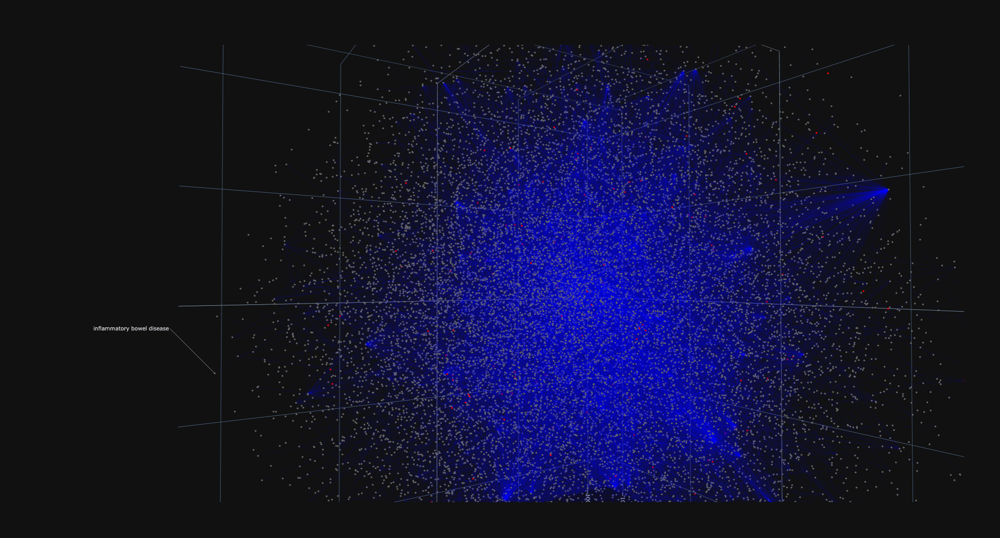

'output_plots/3Dportrait_tsne_DIS_cosine_Human.html'

In [90]:
print('Perplexity:', prplxty3d)
print('Early Exaggeration:', density3d)
print('Learning rate:', l_rate3d)
print('Iterations:', steps3d)

fig = pgo.Figure()
for i in tsne_data:
    fig.add_trace(i)
fig.update_layout(template='plotly_dark', showlegend=False, width=1200, height=1200,
                  scene=dict(
                    aspectratio=dict(
                        x=1,
                        y=1,
                        z=1
                    ),
                    camera=dict(
                        center=dict(
                            x=0,
                            y=0,
                            z=0
                        ),
                        eye=dict(
                            x=1.96903462608,
                            y=-1.09022831971,
                            z=0.405345349304
                        ),
                        up=dict(
                            x=0,
                            y=0,
                            z=1
                        )
                    ),
                    dragmode="turntable",
                    annotations=annotations,
                ))
py.iplot(fig)

plotly.offline.plot(fig, filename = 'output_plots/3Dportrait_tsne_'+feature+'_'+metric+'_Human.html', auto_open=False)

#### UMAP

In [ ]:
n_neighbors = 3 # balance between local and global structure in the data
spread = 1.
min_dist = 0.1 # defines how dense points are stacked together 
metric='cosine'

In [ ]:
%%time 
umap_posG = embed_umap_3D(G, DM, n_neighbors, spread, min_dist, metric)

In [ ]:
%%time 
#umap_edges = get_trace_edges(G, umap_posG, edge_color) 
umap_nodes = get_trace_nodes(G, umap_posG,  l_features, colours, size3d)

#umap_data = [umap_adj_edges, umap_adj_nodes]
umap_data = [umap_nodes]

In [ ]:
print('Perplexity:', prplxty3d)
print('Early Exaggeration:', density3d)
print('Learning rate:', l_rate3d)
print('Iterations:', steps3d)


fig = pgo.Figure()
for i in umap_data:
    fig.add_trace(i)
fig.update_layout(template='plotly_dark', showlegend=False, width=2000, height=2000)
py.iplot(fig)

plotly.offline.plot(fig, filename = 'output_plots/3Dportrait_umap_'+feature+'_'+metric+'_'+organism+'.html', auto_open=False)

#### UMAP PORTRAIT EXPORT Coordinates

In [ ]:
# EXPORT as dataframe

df_3Dportrait_umap = pd.DataFrame(umap_posG3d).T
df_3Dportrait_umap.to_csv(r'output_csv/3DPortrait_umap_'+feature+'_'+organism+'_'+'lrate_'+l_rate3d+'steps_'+steps3d+'_'+metric+'.csv', index = True)

In [ ]:
# IMPORT and convert df to dict 
df_umap_posG3d = pd.read_csv('output_csv/3DPortrait_umap_'+feature+'_'+organism+'_'+'lrate_'+l_rate3d+'steps_'+steps3d+'_'+metric+'.csv', index_col=0)
X_umap = list(df_umap_posG3d['0'])
Y_umap = list(df_umap_posG3d['1'])
Z_umap = list(df_umap_posG3d['2'])

umap_posG3d = dict(zip(list(G.nodes()),zip(X_umap,Y_umap,Z_umap)))

## SPHERE

#### UMAP

In [ ]:
metric = 'cosine'

# Radius parameter
d_param = d_essentiality_scores_sorted

In [ ]:
%%time 
umap_sphere = embed_umap_sphere(G, DM, metric)
umap_sphere_withrad = get_posG_with_sphere_radius(G, umap_sphere, d_param)

In [ ]:
%%time
umap_sphere_trace_edges = get_trace_edges(G, umap_sphere_withrad, edge_color)
umap_sphere_trace_nodes = get_trace_umap_sphere(umap_sphere_withrad, l_features, colours, size3d)
umap_sphere_data = [umap_sphere_trace_edges, umap_sphere_trace_nodes]

In [ ]:
print('Metric:', metric)

fig = pgo.Figure()
for i in umap_sphere_data:
    fig.add_trace(i)
fig.update_layout(template='plotly_dark', showlegend=False, width=2000, height=2000)
py.iplot(fig)

plotly.offline.plot(fig, filename = 'output_plots/3Dsphere_umap_'+feature+'_'+metric+'_'+organism+'.html', auto_open=False)

# ADDITIONAL STUFF

+ HUBS COLOURED

In [136]:
feature = 'HUBS'

df_centralities = pd.read_csv('output_csv/Features_centralities_Dataframe_Human.csv', index_col=0)

d_deghubs = dict(zip(G.nodes(),df_centralities['degs']))
d_clos = dict(zip(G.nodes(), df_centralities['clos']))
d_betw = dict(zip(G.nodes(), df_centralities['betw']))
d_eigen = dict(zip(G.nodes(), df_centralities['eigen']))

cutoff = 3 # number of considered hub nodes 
d_hub_nodes = identify_hubs(d_deghubs, d_clos, d_betw, cutoff)

colours = color_majornodes(G, d_hub_nodes)
#colours = color_nodes_from_dict(G,d_hub_nodes)
edge_color = color_majornodes_outgoingedges(G, d_hub_nodes)

# Annotations 

d_hub_coords = {}
for node,hub in d_hub_nodes.items():
    for k,v in posG.items():
        if node == str(k):
            d_hub_coords[node] = v
            
hub_x = []
hub_y = []
hub_z = []
for node,coords in d_hub_coords.items():
    hub_x.append(coords[0])
    hub_y.append(coords[1])
    hub_z.append(coords[2])
    
annotations = [dict(
                x=hub_x,
                y=hub_y,
                z=hub_z,
                showarrow=True,
                text="Hubs: "+str(i),
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                ) for i, hub_x, hub_y, hub_z in zip(range(1,len(d_hub_nodes)+1),hub_x, hub_y, hub_z)]

+ CLUSTERS COLOURED

In [73]:
feature = 'CLUS'

df_posG = pd.DataFrame(posG).T

n_clus = 15
n_iterations = 50

d_node_clusterid = get_node_clusterid(df_posG, n_clus, n_iterations)
cluster_center_x, cluster_center_y, cluster_center_z = get_clustercenter_xyz(df_posG, n_clus, n_iterations)

colours = color_nodes_from_dict(G, d_node_clusterid)

trace_centers = pgo.Scatter3d(x = cluster_center_x,
                             y = cluster_center_y,
                             z = cluster_center_z,
                                 mode = 'markers',
                                 marker=dict(
                                    size=3,
                                    color='lightgrey',
                                    opacity=1)
                                 )

annotations = [dict(
                x=xi,
                y=yi,
                z=zi,
                showarrow=True,
                text="Cluster: "+str(i),
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                ) for i, xi, yi, zi in zip(range(1,n_clus+1), cluster_center_x,cluster_center_y,cluster_center_z)]

+ CLOSENESS CENTRALITY COLOR 

In [ ]:
feature = 'CLOSE'

# Define colour parameter
d_to_be_coloured = d_clos # dict sorted by dict.values (that way the biggest value matches darkest colour of palette)


# Colouring
colour_groups = set(d_to_be_coloured.values())
colour_count = len(colour_groups)
palette = sns.color_palette('Reds', colour_count)

d_colourgroups = {}
for n in colour_groups:
    d_colourgroups[n] = [k for k in d_to_be_coloured.keys() if d_to_be_coloured[k] == n]
    
d_colourgroups_sorted = {key:d_colourgroups[key] for key in sorted(d_colourgroups.keys())}

d_val_col = {}
for idx,val in enumerate(d_colourgroups_sorted):
    for ix,v in enumerate(palette):
        if idx == ix:
            d_val_col[val] = v
d_node_colour = {}
for y in d_to_be_coloured.items(): # y[0] = node id, y[1] = val
    for x in d_val_col.items(): # x[0] = val, x[1] = (col,col,col)
        if x[0] == y[1]:
            d_node_colour[y[0]]=x[1]
            
# SORT dict based on G.nodes
d_node_colour_sorted = dict([(key, d_node_colour[key]) for key in G.nodes()])

l_col_clos = list(d_node_colour_sorted.values())

colours = l_col_clos 

### COLOURING SUBCATEGORIES e.g. Disease subcategory (i.e. functional property)

In [ ]:
# input = dict

n = len(sub_categories)
colors = generate_colorlist_nodes(n)

doid_coloured = {}
c=0
for k,v in sub_categories.items():
    doid_coloured[k[1]]=colors[c]
    c+=1
    
d_gene_colours = {}
for doid, gene in d_do_genes.items(): 
    for i in gene:
        for do, col in doid_coloured.items():
            if doid == do:
                d_gene_colours[i]=col

# SORT dict based on G.nodes
d_gene_colours_sorted = {key:d_gene_colours[key] for key in G.nodes()}

l_col_subcat = list(d_gene_colours_sorted.values())


# NODE COLOURING based on Subcategory
colours = l_col_subcat 
edge_color = 'lightgrey'

#sns.palplot(colours)

### COLOURING DISEASE SCORES

In [ ]:
# TO DO : MAKE FUNCTION FOR COLORING 

gene_list = gene_list_retisarc



# COLOURS GENERATED / disease score and neighboring nodes

n = len(gene_list)
color_major = generate_colorlist_nodes(n)
 
factor = 1.7 # the higher the lighter
color_minor = []
for i in color_major:
    r,g,b = hex_to_rgb(i)
    color_light = adjust_color_lightness(r,g,b,factor)
    color_minor.append(color_light)
    
    
# ------------------------------------------------------
# NODES coloured 

# Major nodes coloured
d_col_major = {}
for n in d_major_score.keys():
    for i in color_major:
        d_col_major[n] = i

d_col_minor = {}
for node,col in d_col_major.items():
    for node in d_col_major.keys():
        for nd,neigh in major_neigh.items():
            for n in neigh:
                for i in color_minor:
                    if node==nd and n not in d_col_major.keys():
                        d_col_minor[n] = i
                    
d_col = {**d_col_major,**d_col_minor}

d_grey = {}
for i in G.nodes():
    if i not in d_col.keys():
        d_grey[i] = 'lightgrey'
        
        
d_col_all = {**d_col_major, **d_col_minor, **d_grey}
d_col_all_sorted = {key:d_col_all[key] for key in G.nodes()}

l_col_all = list(d_col_all_sorted.values())

colours = l_col_all

# ------------------------------------------------------
# EDGES coloured 

edge_lst = []
for edge in G.edges():
    for e in edge:
        for node in d_col_major.keys():
            if e == node:
                edge_lst.append(edge)
                
d_col_edges = {}
for e in edge_lst:
    for node,col in d_col_major.items():
        if e[0] == node:
            d_col_edges[e]=col
        elif e[1] == node:
            d_col_edges[e]=col

d_grey_edges = {}
for edge in G.edges():
    if edge not in d_col_edges.keys(): 
        d_grey_edges[edge] = 'lightgrey'
        
d_edges_all = {**d_col_edges, **d_grey_edges}

# Sort according to G.edges()
d_edges_all_sorted = {key:d_edges_all[key] for key in G.edges()}

edge_color = list(d_edges_all_sorted.values())